<a href="https://colab.research.google.com/github/SuvitKumar003/computer-Vision-Projects/blob/main/Gradient_updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Helps in edge detection and object detection

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def display_img(img):
  fig=plt.figure(figsize=(12,10))
  ax=fig.add_subplot(111)
  ax.imshow(img,cmap='gray')

In [4]:
img=cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/sudoku.jpg',0)


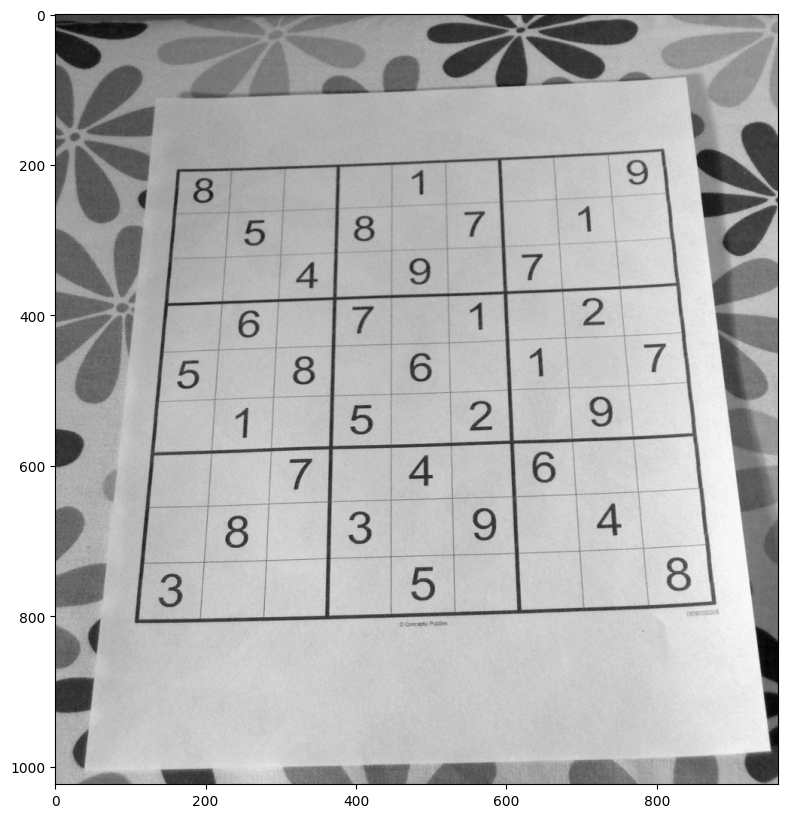

In [5]:
display_img(img)

In [6]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)

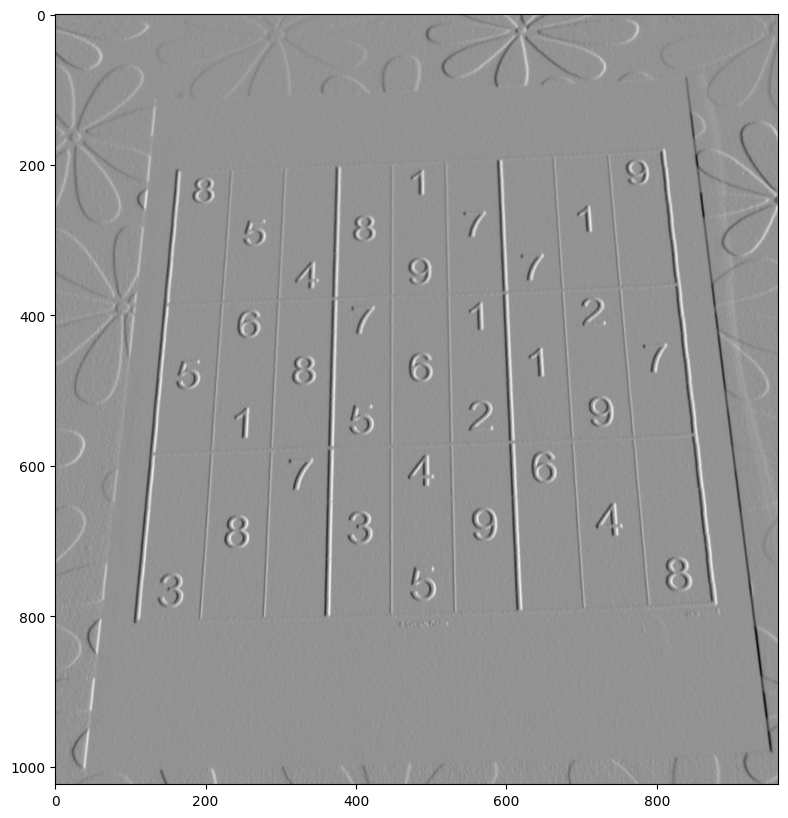

In [7]:
display_img(sobelx)

In [8]:
sobely= cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

only horizontal lines will be more significantly visible


Only

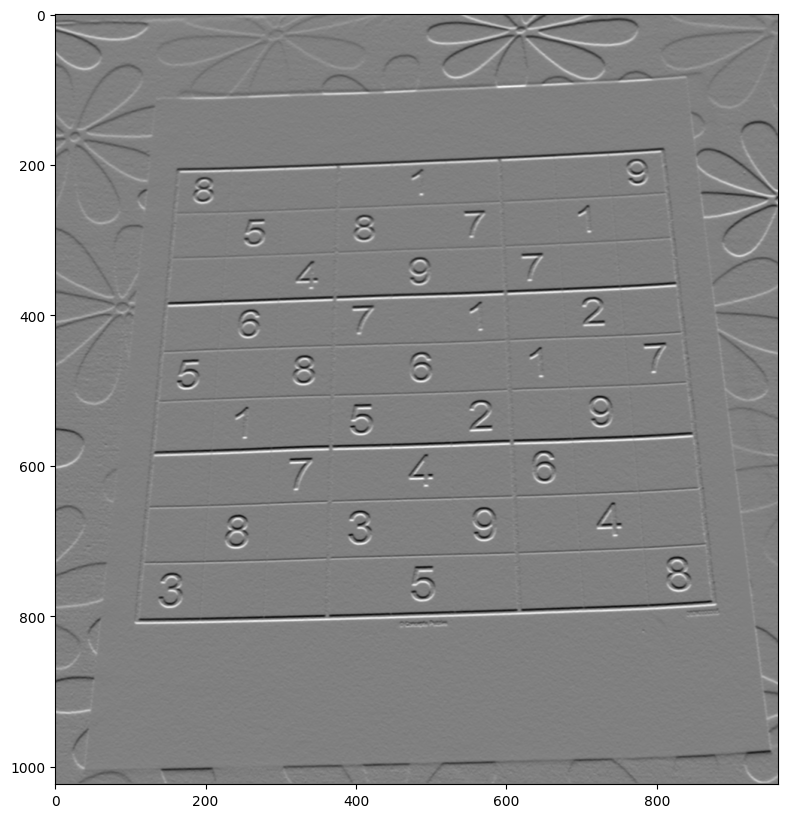

In [9]:
display_img(sobely)

In [10]:
laplacian = cv2.Laplacian(img,cv2.CV_64F)
#using 64F for using the full depth inroder to have more precise pixels


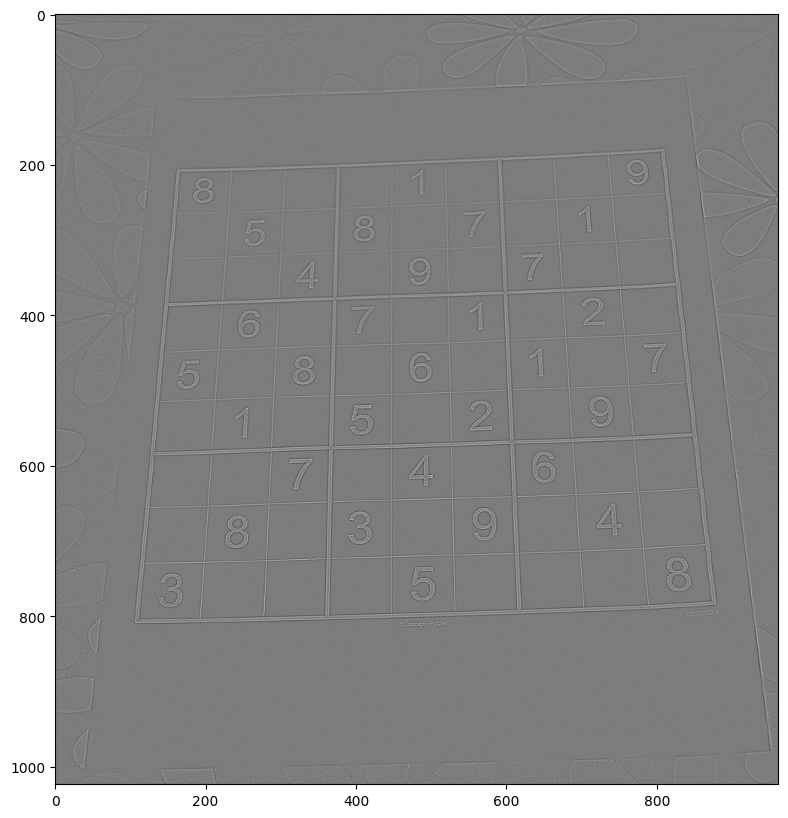

In [11]:
display_img(laplacian)

In [12]:
blended=cv2.addWeighted(src1=sobelx,alpha=0.5,src2=sobely,beta=0.9,gamma=0)
type(blended)
blended.shape

(1024, 962)

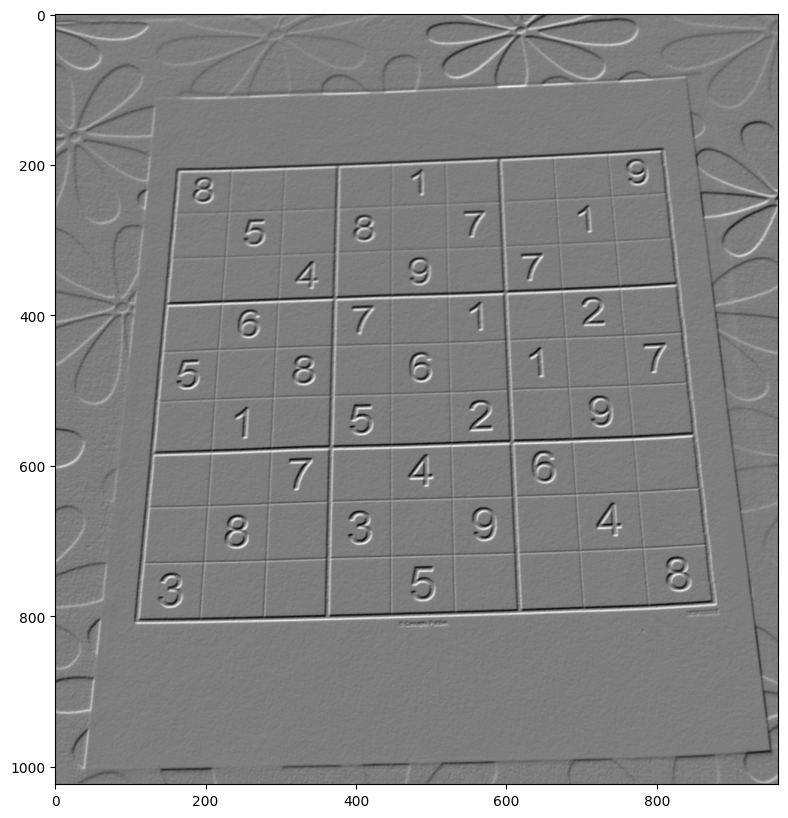

In [13]:
display_img(blended)

In [14]:
ret,th1=cv2.threshold(img,100,255,cv2.THRESH_BINARY)
type(th1)
th1.shape

(1024, 962)

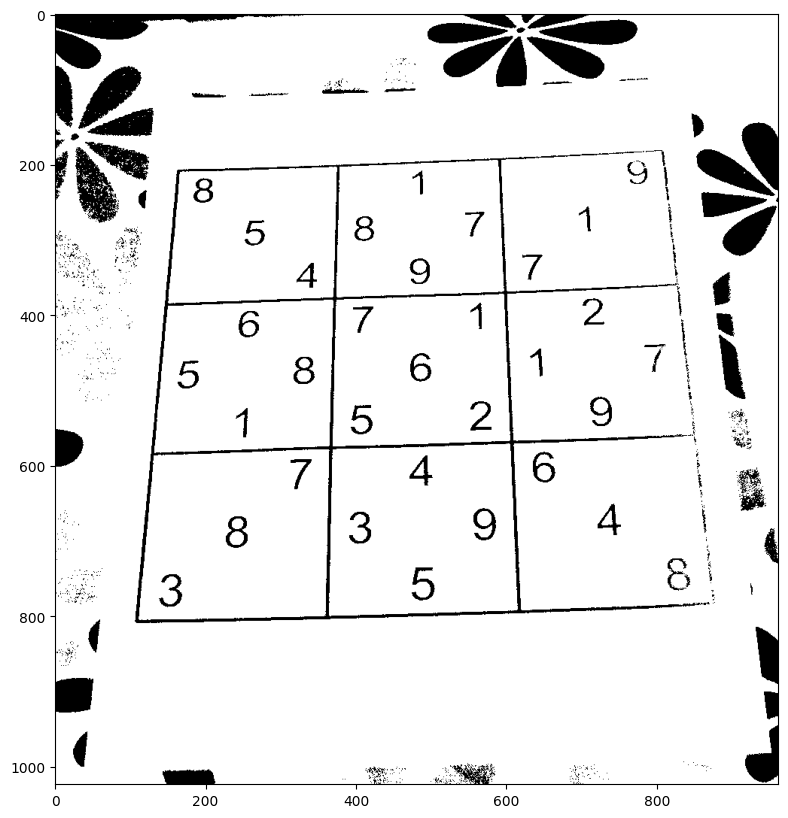

In [15]:
display_img(th1)

In [16]:
print(th1.dtype)
print(blended.dtype)
#print(blended2.dtype)
th1=th1.astype(blended.dtype)
print(th1.dtype)

uint8
float64
float64


In [17]:
blended2=cv2.addWeighted(src1=th1,alpha=0.5,src2=blended,beta=0.5,gamma=0)

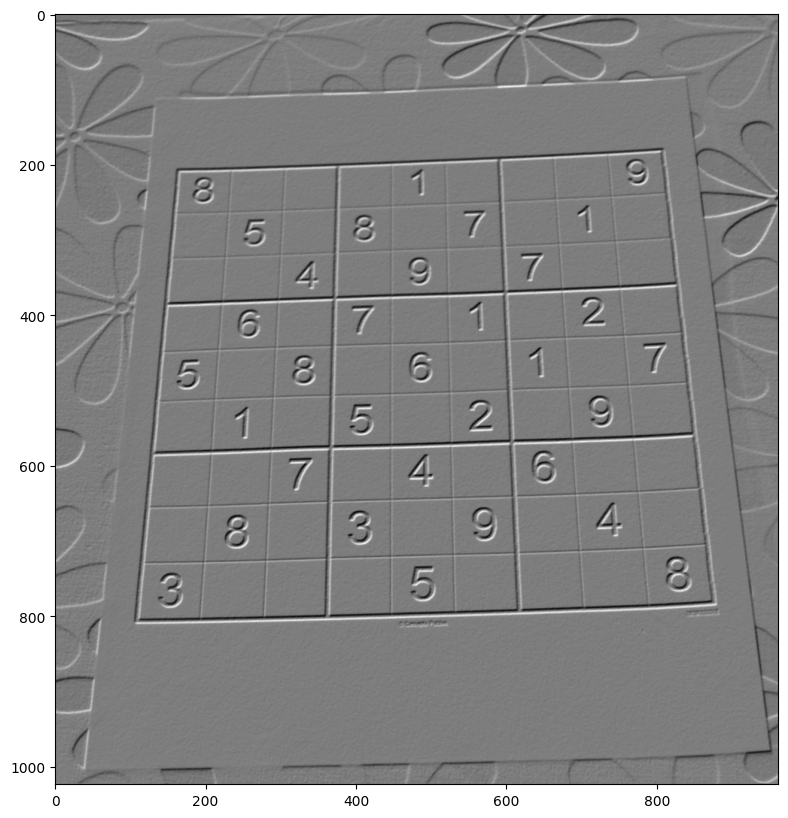

In [18]:
display_img(blended2)

In [19]:
kernel=np.ones((4,4),np.uint8)

for egde detection

In [20]:
gradient=cv2.morphologyEx(blended,cv2.MORPH_GRADIENT,kernel)

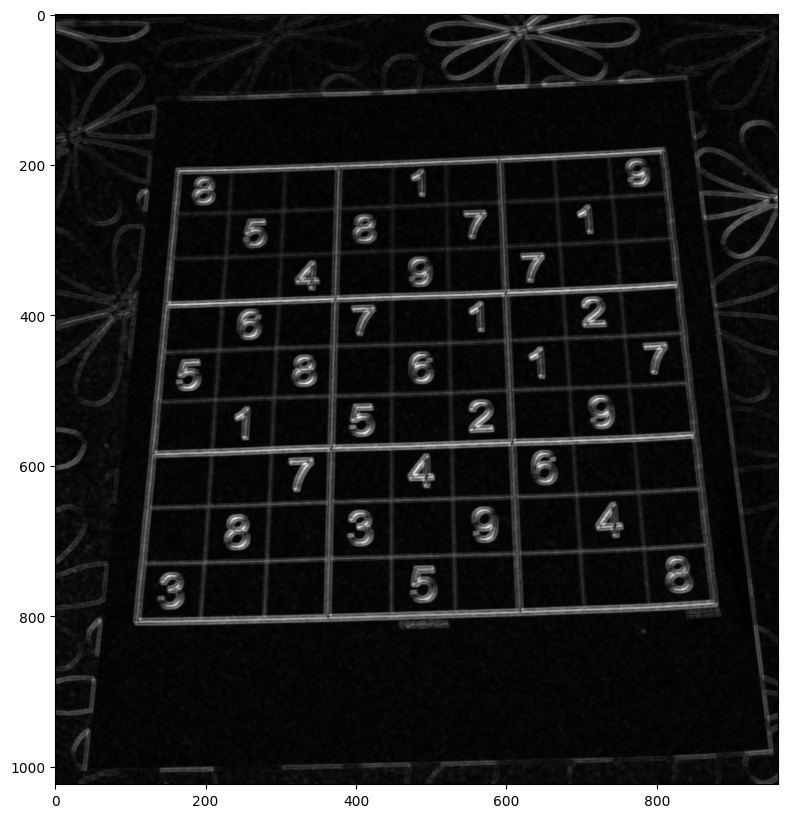

In [21]:
display_img(gradient)

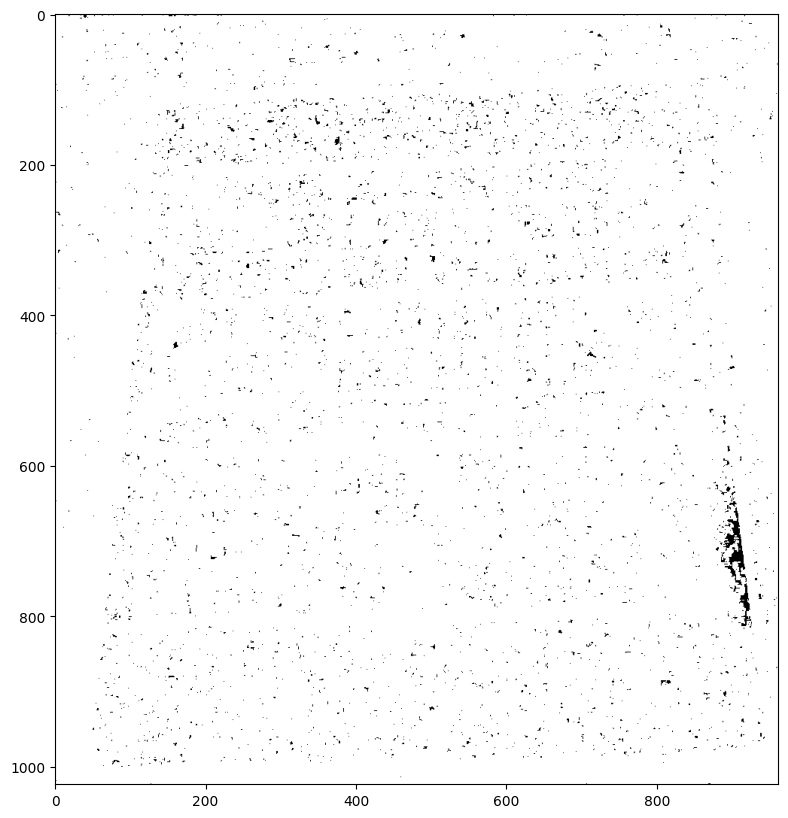

In [22]:

  ret,th2=cv2.threshold(gradient,126,255,cv2.THRESH_BINARY)
  display_img(th2)

display_img(th2)

**Histogram
**

In [23]:
#original BGR channels for open cv
dark_horse = cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/horse.jpg')
#converted to RGB for display
show_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)

rainbow = cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/rainbow.jpg')
show_rainbow = cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

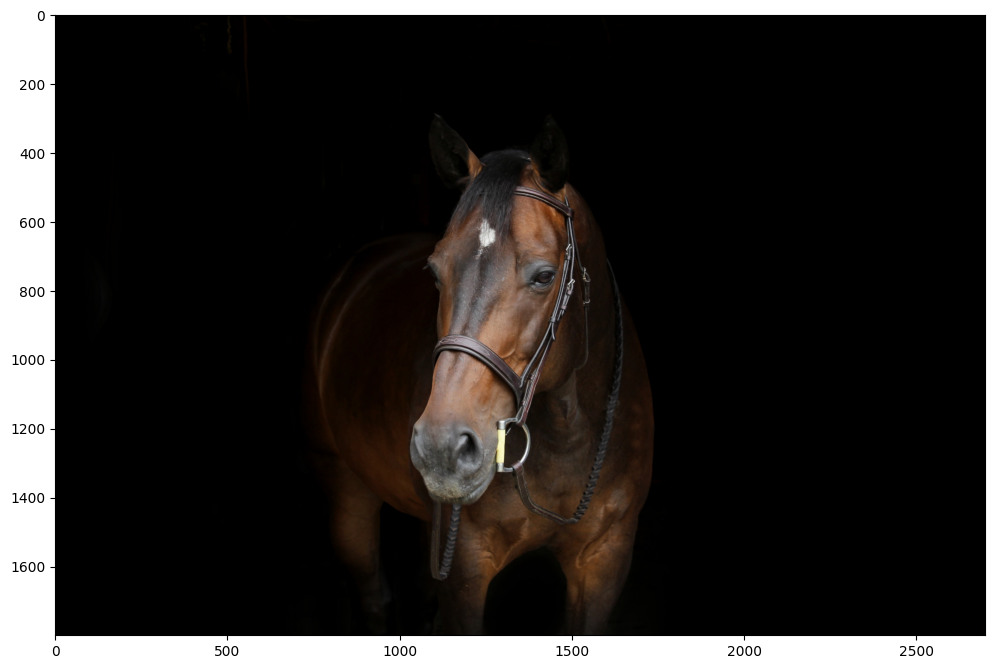

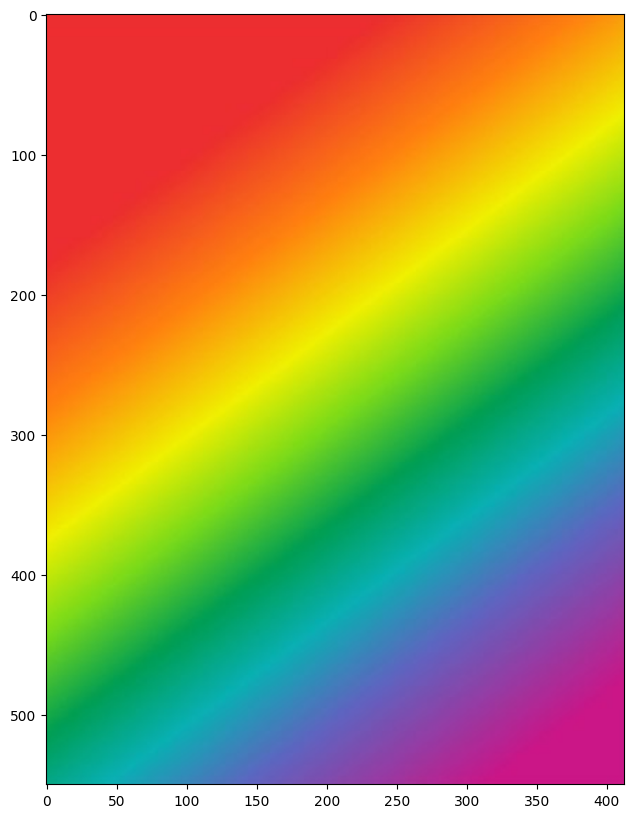

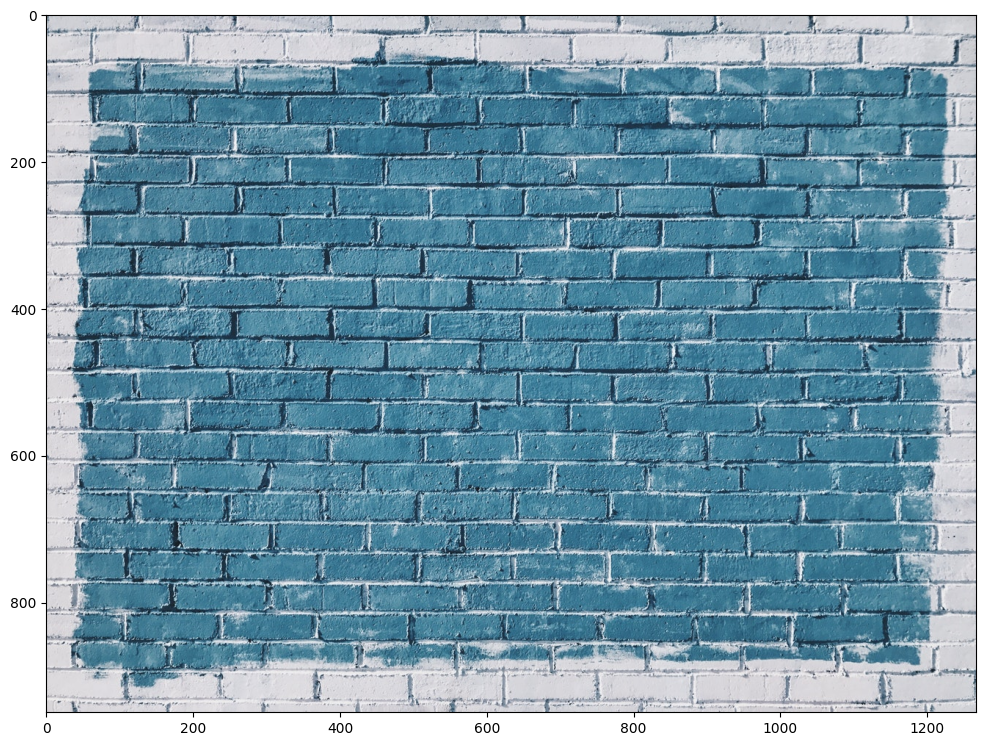

In [24]:
display_img(show_horse)
display_img(show_rainbow)
display_img(show_bricks)

In [25]:
 hist_values=cv2.calcHist([blue_bricks],channels=[0],mask=None,histSize=[256],ranges=[0,256])

In [26]:
hist_values.shape

(256, 1)

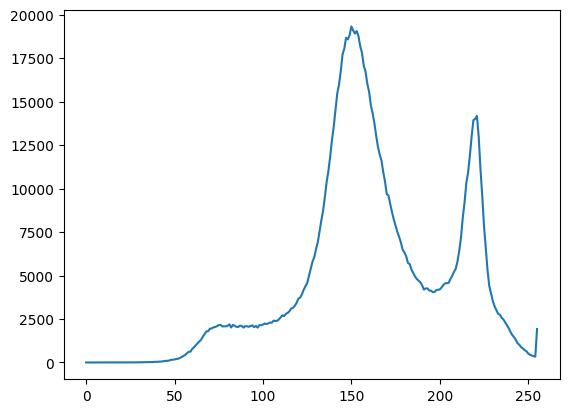

In [27]:
plt.plot(hist_values)

In [28]:
hist_Value2 = cv2.calcHist([dark_horse], channels=[1], mask=None, histSize=[256], ranges=[0, 256])


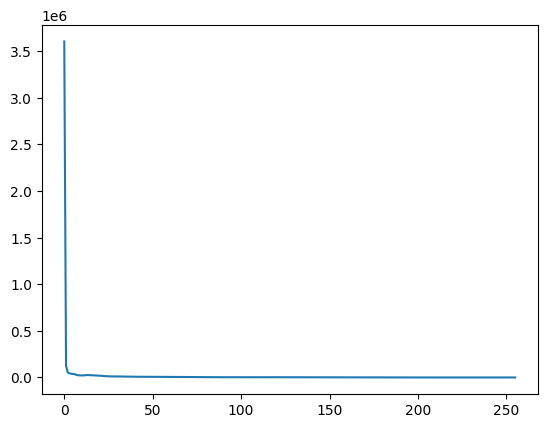

In [29]:
plt.plot(hist_Value2)

In [30]:
img = blue_bricks

showing all the three channels on a single one



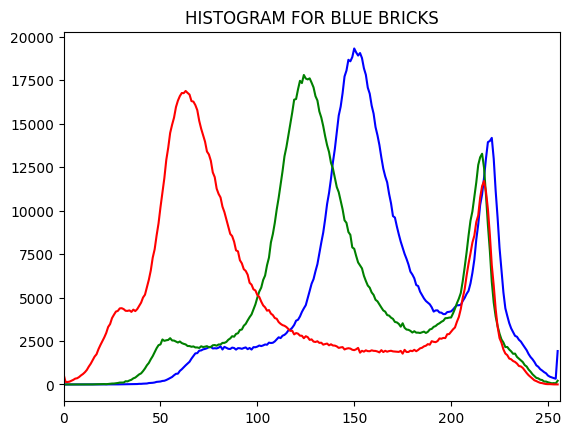

In [31]:
color = ('b','g','r')

for i, col in enumerate(color):
    histr = cv2.calcHist([blue_bricks], [i], mask=None, histSize=[256], ranges=[0, 256])
    plt.plot(histr, color=col)
    plt.xlim([0, 256])

plt.title('HISTOGRAM FOR BLUE BRICKS')
plt.show()


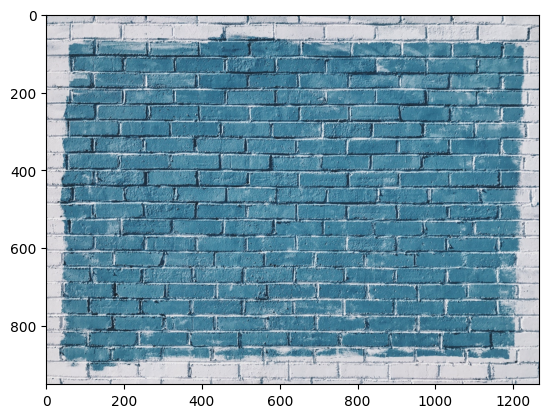

In [32]:
plt.imshow(show_bricks)

In [33]:
img=dark_horse

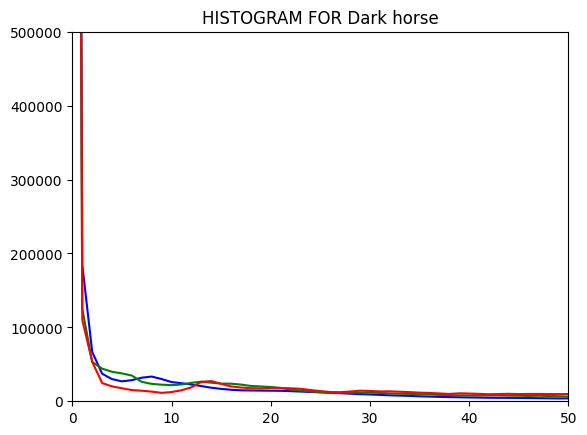

In [34]:
color = ('b','g','r')

for i, col in enumerate(color):
    histr = cv2.calcHist([img], [i], mask=None, histSize=[256], ranges=[0, 256])
    plt.plot(histr, color=col)
    plt.xlim([0,50 ])
    plt.ylim( [0,500000])

plt.title('HISTOGRAM FOR Dark horse')
plt.show()


In [35]:
dark_horse.shape

(1800, 2700, 3)

Equalization of Histogram

In [36]:
#here we will be reduscing the color depth
rainbow=cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/rainbow.jpg')
show_rainbow=cv2.cvtColor(rainbow,cv2.COLOR_BGR2RGB)

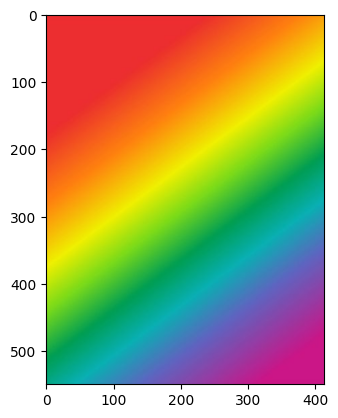

In [37]:
plt.imshow(show_rainbow)

In [38]:
img=rainbow
img.shape

(550, 413, 3)

In [39]:
img.shape[:2]

(550, 413)

In [40]:
mask = np.zeros(img.shape[:2],np.uint8)

In [41]:
mask[300:400,100:400] = 255
#vertical x axis horizotal y axis here

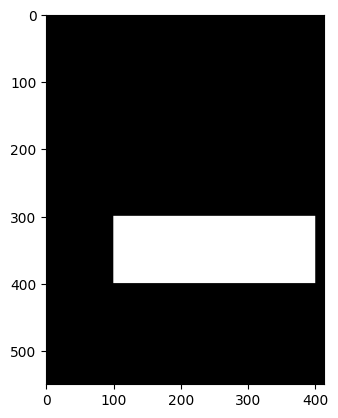

In [42]:
plt.imshow(mask,cmap='gray')

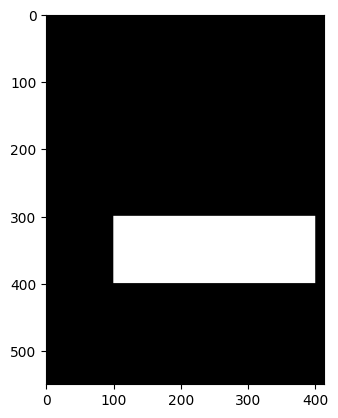

In [43]:
plt.imshow(mask,cmap='gray')

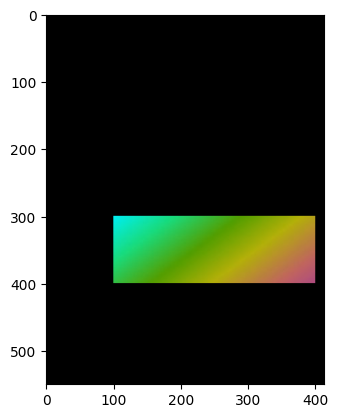

In [44]:
masked_img = cv2.bitwise_and(img,img,mask=mask)
plt.imshow(masked_img)

In [45]:
show_masked_img=cv2.bitwise_and(show_rainbow,show_rainbow,mask=mask)

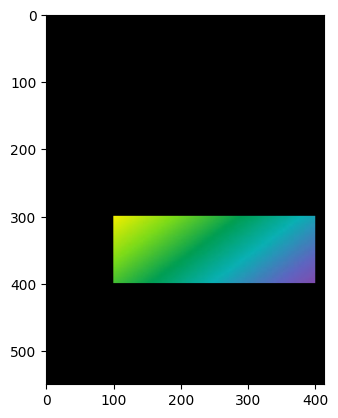

In [46]:
plt.imshow(show_masked_img)

In [47]:
#B G R for cv2 and RGB for plt
hist_mask_Values_red = cv2.calcHist([show_rainbow],channels=[0],mask=None,histSize=[256],ranges=[0,256])

Text(0.5, 1.0, ' RED HISTOGRAM FOR NORMAL RAINBOW ')

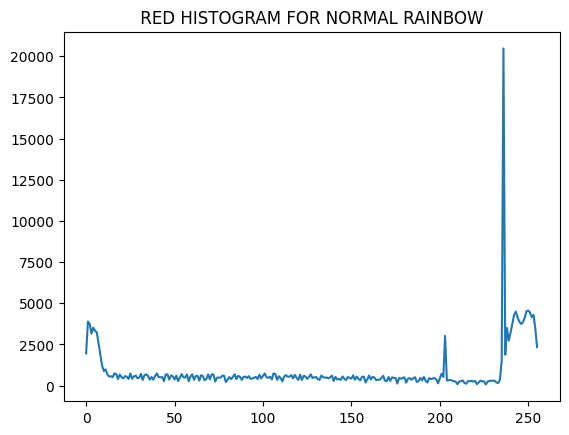

In [48]:
plt.plot(hist_mask_Values_red)
plt.title(' RED HISTOGRAM FOR NORMAL RAINBOW ')

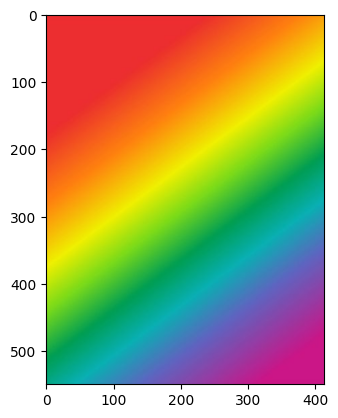

In [49]:
plt.imshow(show_rainbow)

In [50]:
gorilla=cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/gorilla.jpg',0)


In [51]:
def display_img(img,cmap=None):
  fig=plt.figure(figsize=(12,10))
  ax=fig.add_subplot(111)
  ax.imshow(img,cmap)

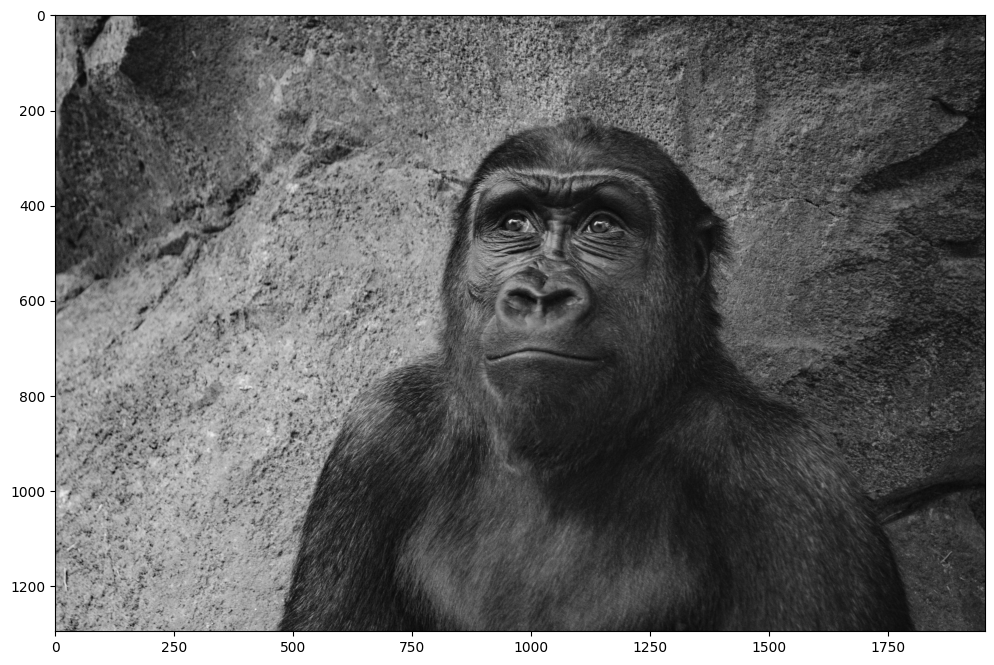

In [52]:
display_img(gorilla,cmap='gray')

In [53]:
gorilla.shape

(1295, 1955)

In [58]:
hist_Values = cv2.calcHist([gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])

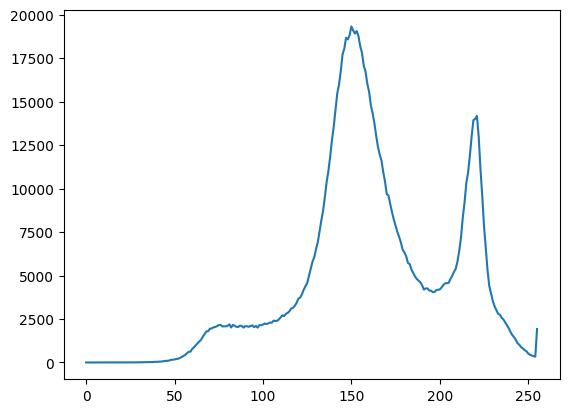

In [56]:
plt.plot(hist_values)

In [59]:
eq_gorilla=cv2.equalizeHist(gorilla)

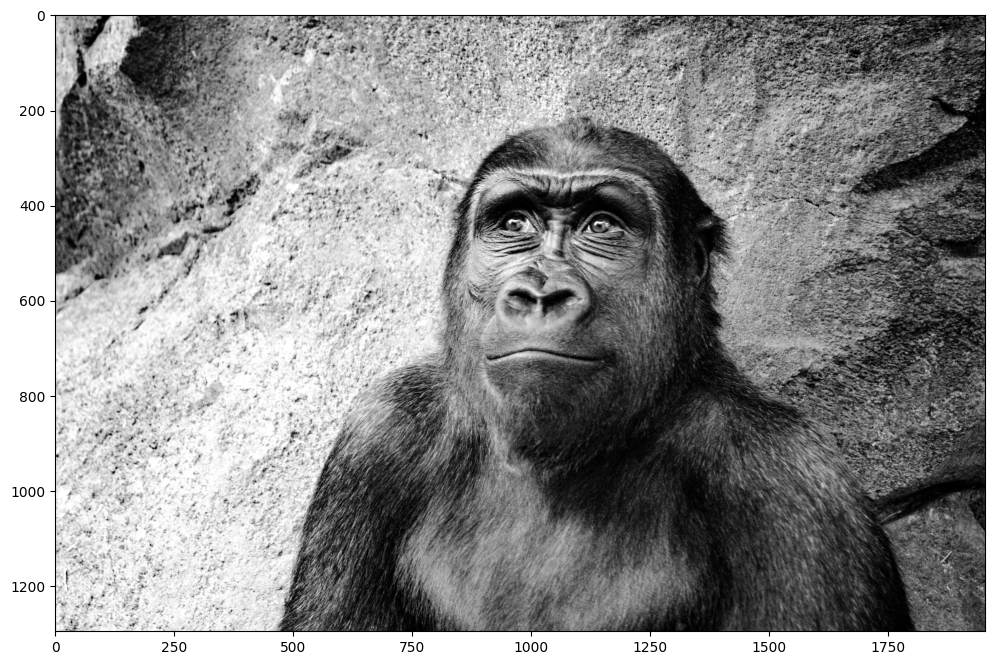

In [61]:
display_img(eq_gorilla,cmap='gray')

In [62]:
hist_Values_eq=cv2.calcHist([eq_gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])

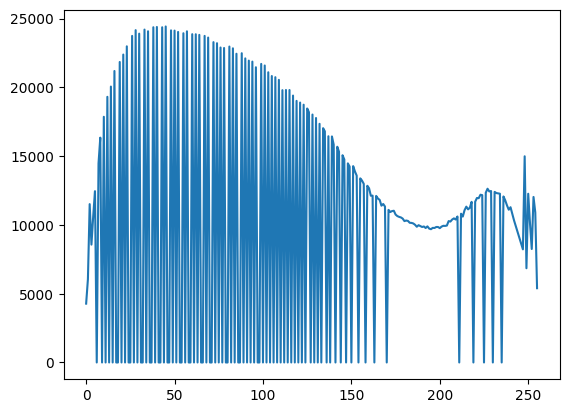

In [63]:
plt.plot(hist_Values_eq)

In [64]:
color_gorilla=cv2.imread('/content/drive/MyDrive/Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/gorilla.jpg')


In [65]:
show_gorilla=cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)

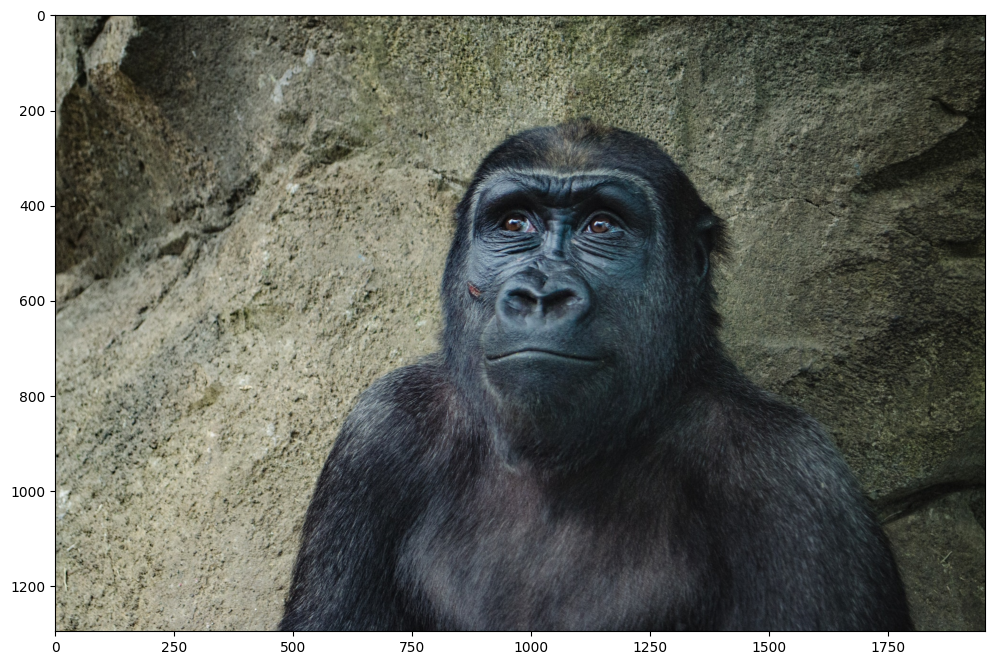

In [66]:
display_img(show_gorilla)

In [67]:
hsv=cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2HSV)

In [70]:
hsv[:,:,2]
#it means we are silicng the whole rows and whole columns from the channel Value

array([[127, 121, 115, ...,  43,  42,  42],
       [121, 124, 123, ...,  47,  49,  51],
       [118, 129, 131, ...,  47,  50,  53],
       ...,
       [196, 198, 185, ...,  55,  55,  55],
       [184, 185, 182, ...,  51,  52,  53],
       [174, 170, 173, ...,  49,  50,  50]], dtype=uint8)

In [72]:
hsv[:,:,2].min()

1

In [73]:
hsv[:,:,2]=cv2.equalizeHist(hsv[:,:,2])

In [74]:
eq_color_gorilla=cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)

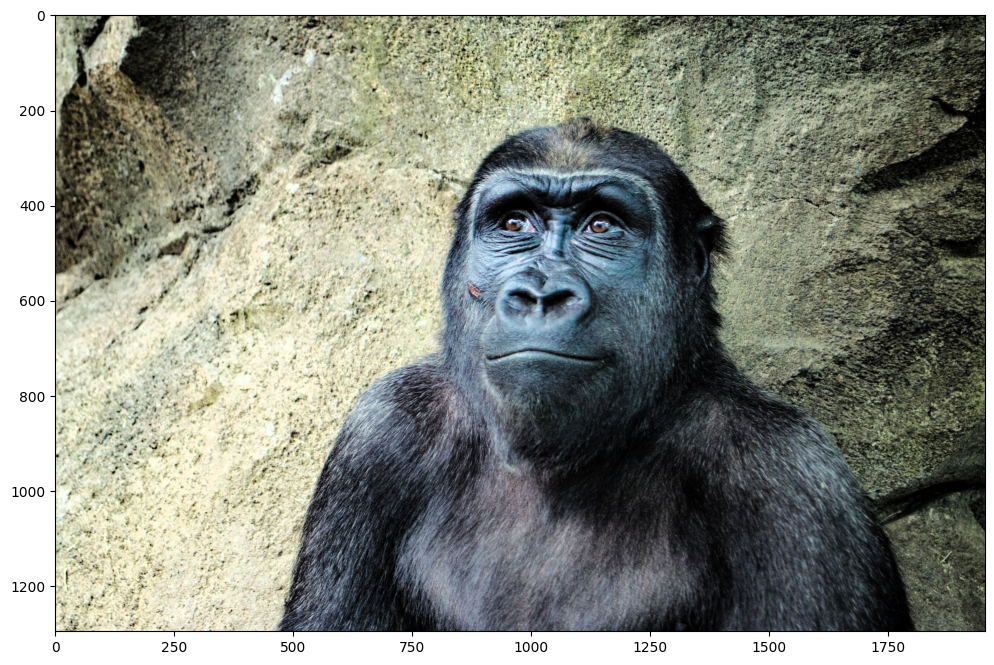

In [75]:
display_img(eq_color_gorilla)

In [79]:
hist_values_eq_color=cv2.calcHist([eq_color_gorilla],channels=[1],mask=None,histSize=[256],ranges=[0,256])

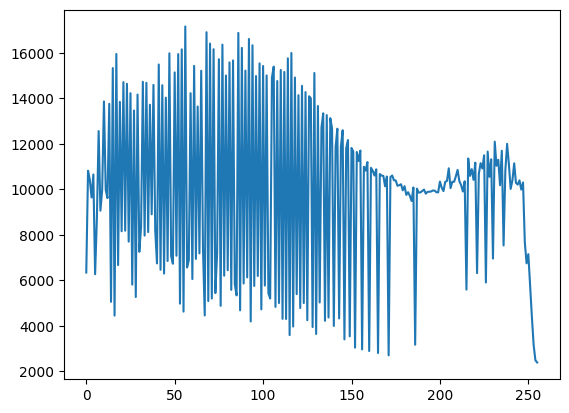

In [80]:
plt.plot(hist_values_eq_color)